Author: Andrii Morozov(morozan1)

### Úkol

Jako dataset jsem si vybral dataset zaměřený na ceny nájmů v Praze, který je dostupný ve veřejném přístupu. Tento dataset jsem našel na Kaggle: [https://www.kaggle.com/datasets/vitgadurek/rent-prices-in-prague]

Cílovou proměnnou v tomto modelu je cena za nájem, která se předpovídá na základě různých faktorů, jako jsou velikost bytu, lokalita, patro atd. Cílem je vytvořit model, který bude co nejpřesněji odhadovat cenu na základě těchto atributů.

Takže model bude řešit regresní úlohu.

#### Na začátku importujeme potřebné knihovny

In [130]:
import pandas as pd
import matplotlib.pyplot as plt
import kagglehub
from kagglehub import KaggleDatasetAdapter
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import ParameterGrid, train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
import dtreeviz
from joblib import Parallel, delayed
import numpy as np
import matplotlib.colors as mcolors

### Načítáme dataset z Kaggle a zkoumáme jeho strukturu

Nejprve načteme dataset z Kaggle. Pro zajištění správného pochopení dat se podíváme, jaké sloupce dataset obsahuje, a provedeme rychlou inspekci jeho struktury.

K tomu využijeme metodu **`info()`** pro získání přehledu o typech dat a počtu neúplných hodnot.

In [131]:
raw_df = kagglehub.load_dataset(
        KaggleDatasetAdapter.PANDAS,
        "vitgadurek/rent-prices-in-prague/versions/2",
        "flats_english.csv",
)

print("\nInformace o datasetu:")
raw_df.info()


Informace o datasetu:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3845 entries, 0 to 3844
Data columns (total 41 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Total price                   3809 non-null   object 
 1   Agency Flat ID                3477 non-null   object 
 2   Last Update                   3845 non-null   object 
 3   Construction Type             3845 non-null   object 
 4   Building condition            3845 non-null   object 
 5   Ownership                     3845 non-null   object 
 6   Floor                         3845 non-null   object 
 7   Usable area                   3845 non-null   object 
 8   Floor area                    2178 non-null   object 
 9   Parking                       775 non-null    object 
 10  Garage                        763 non-null    object 
 11  Move-in date                  3845 non-null   object 
 12  Water Supply                  1472 non-

#### Odstraňujeme duplicity a chybějící hodnoty

Nejprve vybereme pouze ty sloupce, které nemají významné množství chybějících dat a které jsou relevantní pro náš model. Dále odstraníme duplicitní záznamy a řádky s prázdnými hodnotami.

Tento krok zajistí, že data budou kvalitní a vhodná pro trénování modelu.

In [132]:
columns_to_keep = [
    'Total price',
    'Last Update',
    'Construction Type',
    'Building condition',
    'Ownership',
    'Floor',
    'Usable area',
    'Move-in date',
    'Address'
]

raw_df = raw_df.dropna(subset=columns_to_keep)
raw_df = raw_df.drop_duplicates()
data = raw_df[columns_to_keep].copy()

data.columns = [
    'price',
    'update',
    'constr',
    'cond',
    'owner',
    'floor',
    'area',
    'move-in',
    'addr'
]

data.head()

,price,update,constr,cond,owner,floor,area,move-in,addr
0,25 000 Kč per month,26.04.2024,Mixed,New building,Personal,5. floor,50 m2,Immediately,"Studničkova, Praha 2 - Nové Město"
1,29 900 Kč per month,4.6.2024,Brick,Very good,Personal,3. floor,100 m2,01.07.2024,"Umělecká, Praha - Holešovice"
2,11 000 Kč per month,4.6.2024,Brick,Very good,Personal,4. floor,22 m2,Immediately,"Drahobejlova, Praha 9 - Libeň"
3,18 000 Kč per month,4.6.2024,Brick,New building,Personal,5. floor,45 m2,Immediately,"Hnězdenská, Praha 8 - Troja"
4,21 000 Kč per month,4.6.2024,Brick,Very good,Personal,3. floor out of 6 including 1 basement,74 m2,Immediately,"Toufarova, Praha 5 - Stodůlky"


#### Kontrola a úprava sloupce s cenou

Zjistili jsme, že hodnoty v cenovém sloupci obsahují nežádoucí symboly. Nejprve zkontrolujeme, zda všechny záznamy obsahují text *'per month'* — to by mohlo naznačovat, že některé ceny mohou být v jiném rozsahu (např. *per week* nebo *per day*). 

In [133]:
if all(data['price'].str.contains("per month")):
   print("Všechny hodnoty obsahují 'per month'.")
else:
   print("Některé hodnoty neobsahují 'per month'.")

Některé hodnoty neobsahují 'per month'.


Prozkoumáme, jaké konkrétní hodnoty se v tomto sloupci vyskytují, čím jsou charakteristické a jaký je jejich počet. Tento přehled nám pomůže rozhodnout, jak s těmito hodnotami dále pracovat a zda je třeba je upravit nebo odstranit.

In [134]:
invalid_prices = data[~data['price'].str.contains("per month", na=False)]

print("\nNalezeno", len(invalid_prices), "neplatných cen:")
print(invalid_prices['price'].head())


Nalezeno 19 neplatných cen:
160     32 000 Kč za nemovitost
266     15 990 Kč za nemovitost
734     32 000 Kč za nemovitost
882     15 990 Kč za nemovitost
1005    39 500 Kč za nemovitost
Name: price, dtype: object


In [135]:
invalid_prices2 = invalid_prices[~invalid_prices['price'].str.contains("za nemovitost", na=False)]

print("\nNalezeno", len(invalid_prices2), "neplatných cen:")


Nalezeno 0 neplatných cen:


Na základě jejich počtu a samotných hodnot lze usoudit, že i v tomto případě jde o ceny za měsíc. Proto je ponecháme.
Odstraníme nežádoucí symboly a převedeme hodnoty na číselný formát, aby byly připravené pro další zpracování modelem.

In [136]:
data['price_num'] = data['price'].str.replace("per month", "").str.replace("za nemovitost", "").str.replace(" ", "").str.replace("Kč", "")

data['price_num'] = pd.to_numeric(data['price_num'], errors='coerce')

print("\nNalezeno", data['price_num'].isna().sum(), "neplatných cen.")
print("Minimální cena:", data['price_num'].min())
print("Maximální cena:", data['price_num'].max())


Nalezeno 215 neplatných cen.
Minimální cena: 30.0
Maximální cena: 270000.0


Některé ceny měly jiný formát a nebyly převedeny na číselnou hodnotu. Tyto záznamy odstraníme z datového rámce, aby naše data byla konzistentní a vhodná pro trénování modelu.

V datech jsou přítomny anomálně vysoké i nízké hodnoty cen. Pro lepší pochopení jejich rozložení se podíváme na histogram cen, přičemž se zaměříme právě na tyto extrémní hodnoty.

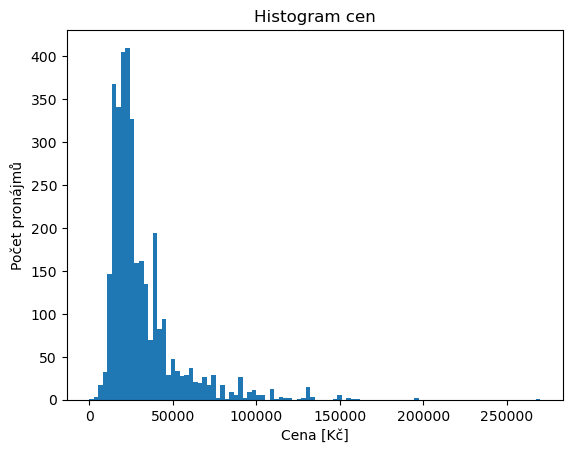

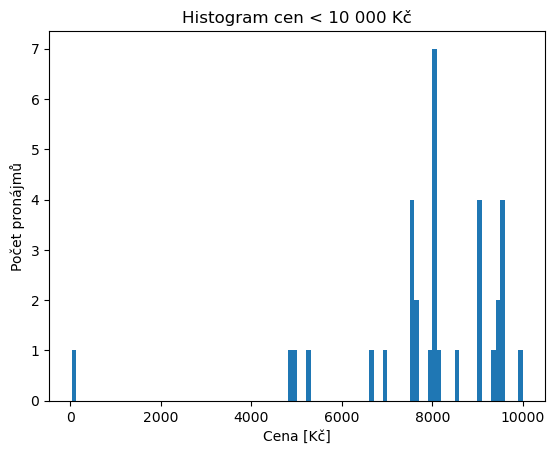

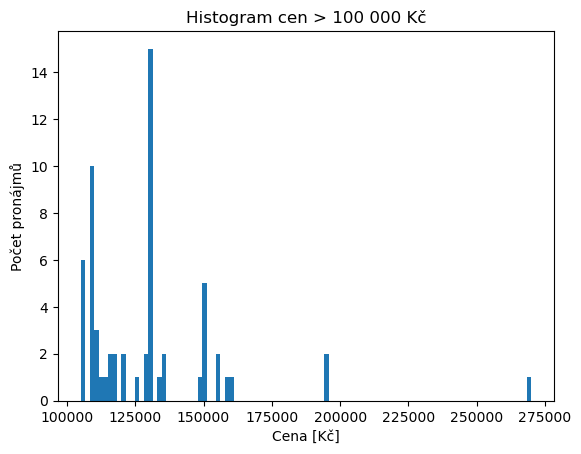

In [137]:
plt.hist(data['price_num'], bins=100)
plt.title('Histogram cen')
plt.xlabel('Cena [Kč]')
plt.ylabel('Počet pronájmů')
plt.show()

plt.hist(data[data['price_num'] < 10000]['price_num'], bins=100)
plt.title('Histogram cen < 10 000 Kč')
plt.xlabel('Cena [Kč]')
plt.ylabel('Počet pronájmů')
plt.show()

plt.hist(data[data['price_num'] > 100000]['price_num'], bins=100)
plt.title('Histogram cen > 100 000 Kč')
plt.xlabel('Cena [Kč]')
plt.ylabel('Počet pronájmů')
plt.show()

Z histogramů lze usoudit, že za výjimečné hodnoty lze považovat ceny vyšší než **175 000** nebo nižší než **6 000**. Tyto hodnoty pravděpodobně neodpovídají reálným tržním podmínkám a mohou být výsledkem chyby v datech.

In [138]:
data.drop(data[(data['price_num'].isna()) | (data['price_num'] < 6000) | (data['price_num'] > 175000)].index, inplace=True)

data.head()

,price,update,constr,cond,owner,floor,area,move-in,addr,price_num
0,25 000 Kč per month,26.04.2024,Mixed,New building,Personal,5. floor,50 m2,Immediately,"Studničkova, Praha 2 - Nové Město",25000.0
1,29 900 Kč per month,4.6.2024,Brick,Very good,Personal,3. floor,100 m2,01.07.2024,"Umělecká, Praha - Holešovice",29900.0
2,11 000 Kč per month,4.6.2024,Brick,Very good,Personal,4. floor,22 m2,Immediately,"Drahobejlova, Praha 9 - Libeň",11000.0
3,18 000 Kč per month,4.6.2024,Brick,New building,Personal,5. floor,45 m2,Immediately,"Hnězdenská, Praha 8 - Troja",18000.0
4,21 000 Kč per month,4.6.2024,Brick,Very good,Personal,3. floor out of 6 including 1 basement,74 m2,Immediately,"Toufarova, Praha 5 - Stodůlky",21000.0


#### Vytvoření nového příznaku: Čekací doba na nastěhování

Jelikož sloupce **datum aktualizace inzerátu** a **datum nastěhování** samy o sobě neposkytují dostatečně užitečné informace, vytvoříme z nich nový příznak pro model. Tento příznak bude reprezentovat dobu čekání na nastěhování od okamžiku poslední aktualizace inzerátu. Tento krok nám umožní lépe pochopit dynamiku nabídky a poptávky na trhu.

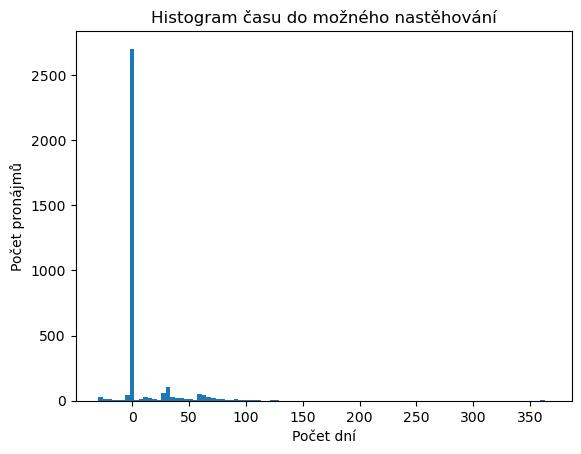

In [139]:
data.loc[data['move-in'] == 'Immediately', 'move-in'] = data['update']

data['time_to_move_in'] = (pd.to_datetime(data['move-in'], dayfirst=True) - pd.to_datetime(data['update'], dayfirst=True)).dt.days

plt.hist(data['time_to_move_in'], bins=100)
plt.title('Histogram času do možného nastěhování')
plt.xlabel('Počet dní')
plt.ylabel('Počet pronájmů')
plt.show()

Některé hodnoty čekací doby vycházely negativní nebo příliš vysoké, což naznačuje možné chyby v datech. Tyto hodnoty je třeba upravit nebo odstranit.

In [140]:
data.loc[data['time_to_move_in'] < 0, 'time_to_move_in'] = 0
data.drop(data[data['time_to_move_in'] > 100].index, inplace=True)

#### Převedení kategoriálních hodnot na číselné ekvivalenty

Máme tři sloupce, které pravděpodobně obsahují malé množství jedinečných hodnot. Pokud tomu tak je, převedeme tyto hodnoty na číselné ekvivalenty, což umožní modelu zpracovat kategorie.

In [141]:
print("Unikátní hodnoty v 'constr':\n", data['constr'].unique())
print("Unikátní hodnoty v 'cond':\n", data['cond'].unique())
print("Unikátní hodnoty v 'owner':\n", data['owner'].unique())

Unikátní hodnoty v 'constr':
 ['Mixed' 'Brick' 'Panel' 'Frame' 'Modular' 'Stone']
Unikátní hodnoty v 'cond':
 ['New building' 'Very good' 'After reconstruction' 'Good'
 'Before reconstruction' 'Project' 'Under reconstruction']
Unikátní hodnoty v 'owner':
 ['Personal' 'Cooperative' 'State/municipal']


In [142]:
data['constr_num'] = data['constr'].map({
    'Mixed': 0,
    'Brick': 1,
    'Panel': 2,
    'Frame': 3,
    'Modular': 4,
    'Stone': 5
})

data['cond_num'] = data['cond'].map({
    'Project': 0,
    'Before reconstruction': 1,
    'Under reconstruction': 2,
    'After reconstruction': 3,
    'Good': 4,
    'Very good': 5,
    'New building': 6
})

data['owner_num'] = data['owner'].map({
    'Personal': 0,
    'Cooperative': 1,
    'State/municipal': 2
})

#### Převod plochy na číselný formát

Převodíme **plochu** na číselný formát a zhodnotíme, jaké hodnoty jsme získali.

Nalezeno 0 neplatných ploch.
Minimální plocha: 9
Maximální plocha: 437


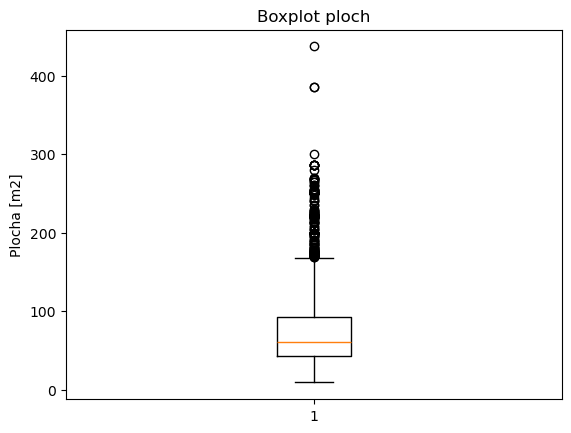

In [143]:
data['area_num'] = data['area'].str.replace("m2", "").str.replace(" ", "")
data['area_num'] = pd.to_numeric(data['area_num'], errors='coerce')

print("Nalezeno", data['area_num'].isna().sum(), "neplatných ploch.")
print("Minimální plocha:", data['area_num'].min())
print("Maximální plocha:", data['area_num'].max())

plt.boxplot(data['area_num'])
plt.title('Boxplot ploch')
plt.ylabel('Plocha [m2]')
plt.show()

Plochy větší než 300 m² pravděpodobně představují odlehlé hodnoty (outliery). Pro hodnoty mezi 200 m² a 300 m² se podíváme na jejich ceny, abychom zjistili, nejedná-li se o nějaké anomálie.

In [144]:
print("Počet bytů s plochou > 300 m2:", len(data[data['area_num'] > 300]))

large_poperties_prices = data.loc[(data['area_num'] > 200) & (data['area_num'] <= 300), 'price_num']

print("\nCeny bytů s plochou > 200 m2 a <= 300 m2:")
print("Průměrná cena:", large_poperties_prices.mean())
print("Medián ceny:", large_poperties_prices.median())
print("Minimální cena:", large_poperties_prices.min())
print("Maximální cena:", large_poperties_prices.max())

Počet bytů s plochou > 300 m2: 3

Ceny bytů s plochou > 200 m2 a <= 300 m2:
Průměrná cena: 93550.52631578948
Medián ceny: 90000.0
Minimální cena: 44000.0
Maximální cena: 159900.0


Zanecháme pouze plochy mezi 200 m² a 300 m², protože ceny v těchto případech vypadají logicky. Anomálně nízké hodnoty jsou v datech nepřítomné.

In [145]:
data.drop(data[data['area_num'] > 300].index, inplace=True)

#### Převod patra na číselný formát

Převodíme **patro** na číselný formát. Z řádků, které vidíme, se zdá, že patro je vždy uvedeno na začátku řetězce.

In [146]:
data['floor_num'] = data['floor'].str.split('.').str[0]
data['floor_num'] = pd.to_numeric(data['floor_num'], errors='coerce')


bad_floors = data[data['floor_num'].isna()]
print("\nNalezeno", len(bad_floors), "neplatných pater:")
print(bad_floors['floor'].unique())


Nalezeno 21 neplatných pater:
['ground out of 3' 'ground' 'ground out of 4' 'ground out of 6']


Některé nemovitosti mají **patro** označené jako 'ground'. Tyto hodnoty zpracujeme a přiřadíme jim číselný ekvivalent.

Poté se podíváme, jaké hodnoty máme po této úpravě. Použijeme **boxplot**.

Minimální patro: -3.0
Maximální patro: 136.0


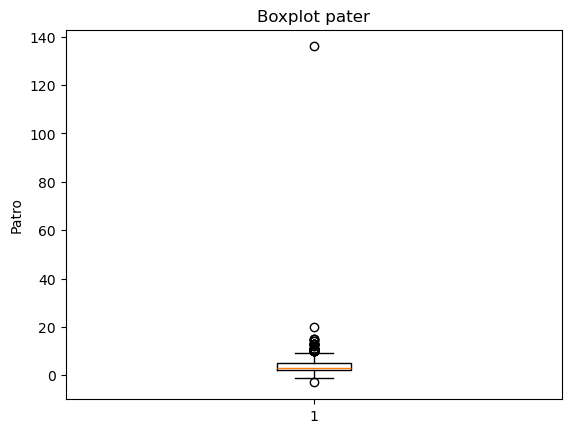

In [147]:
data.loc[data['floor_num'].isna(), 'floor_num'] = 0

print("Minimální patro:", data['floor_num'].min())
print("Maximální patro:", data['floor_num'].max())

plt.boxplot(data['floor_num'])
plt.title('Boxplot pater')
plt.ylabel('Patro')
plt.show()

Je logické omezit maximální **patro** na hodnotu 20, pokud je skutečná hodnota vyšší. Tato změna by pravděpodobně neměla zásadní vliv na model.

Podíváme se na původní řádky, které obsahují **negativní hodnoty**, abychom zjistili, zda je můžeme považovat za **suteren**.

In [148]:
data.loc[data['floor_num'] > 20, 'floor_num'] = 20

print(data.loc[data['floor_num'] < 0, 'floor'].unique())

['-1. floor' '-1. floor out of 7 including 1 basement'
 '-1. floor out of 6' '-1. floor out of 5 including 1 basement'
 '-1. floor out of 2' '-1. floor including 1 basement' '-3. floor']


#### Převod adresy na číselný formát

Nyní budeme převádět **adresu** na číselný formát. Pokusíme se zachovat co nejpřesnější lokaci, přičemž minimalizujeme počet možných variant.

In [149]:
data['loc'] = data['addr'].str.split(', ').str[1]
print("Počet unikátních lokalit:", len(data['loc'].unique()))
print("Počet špatných lokalit:", data['loc'].isna().sum())

data['loc'].head()

Počet unikátních lokalit: 150
Počet špatných lokalit: 44


0    Praha 2 - Nové Město
1      Praha - Holešovice
2         Praha 9 - Libeň
3         Praha 8 - Troja
4      Praha 5 - Stodůlky
Name: loc, dtype: object

In [150]:
data.dropna(subset=['loc'], inplace=True)

data['loc'] = data['loc'].str.split(' - ').str[1]

print("Počet unikátních lokalit:", len(data['loc'].unique()))
print("Počet špatných lokalit:", data['loc'].isna().sum())
print(data['loc'].value_counts())

Počet unikátních lokalit: 97
Počet špatných lokalit: 34
loc
Vinohrady      504
Nové Město     284
Smíchov        246
Žižkov         184
Malá Strana    135
              ... 
Petrovice        1
Točná            1
Lysolaje         1
Praha 10         1
Praha 2          1
Name: count, Length: 96, dtype: int64


In [151]:
data.dropna(subset=['loc'], inplace=True)

print("Počet nemovitostí s nepřesnou lokalitou:", len(data[data['loc'].str.contains("Praha", na=False)]))

Počet nemovitostí s nepřesnou lokalitou: 19


In [152]:
data.drop(data[data['loc'].str.contains('Praha')].index, inplace=True)

print("Počet lokalit:", len(data['loc'].unique()))
print("Seznam lokalit:", data['loc'].unique())

data['loc_num'] = LabelEncoder().fit_transform(data['loc'])

Počet lokalit: 89
Seznam lokalit: ['Nové Město' 'Holešovice' 'Libeň' 'Troja' 'Stodůlky' 'Vinohrady' 'Žižkov'
 'Košíře' 'Staré Město' 'Josefov' 'Karlín' 'Hostivař' 'Střížkov' 'Podolí'
 'Malá Strana' 'Smíchov' 'Vršovice' 'Hlubočepy' 'Chodov' 'Jinonice'
 'Radlice' 'Vyšehrad' 'Bubeneč' 'Michle' 'Hloubětín' 'Letňany' 'Krč'
 'Nusle' 'Vokovice' 'Kamýk' 'Motol' 'Vysočany' 'Záběhlice' 'Strašnice'
 'Uhříněves' 'Malešice' 'Štěrboholy' 'Háje' 'Prosek' 'Dejvice' 'Vinoř'
 'Dolní Měcholupy' 'Kbely' 'Břevnov' 'Lhotka' 'Řepy' 'Střešovice'
 'Zbraslav' 'Bohnice' 'Kobylisy' 'Horní Měcholupy' 'Kyje' 'Liboc'
 'Veleslavín' 'Třeboradice' 'Zličín' 'Újezd u Průhonic' 'Kunratice'
 'Nedvězí u Říčan' 'Hodkovičky' 'Lipence' 'Modřany' 'Radotín' 'Řeporyje'
 'Černý Most' 'Braník' 'Libuš' 'Velká Chuchle' 'Hrdlořezy' 'Lysolaje'
 'Kolovraty' 'Újezd nad Lesy' 'Ruzyně' 'Suchdol' 'Čimice' 'Třebonice'
 'Klánovice' 'Horní Počernice' 'Běchovice' 'Dubeč' 'Ďáblice' 'Čakovice'
 'Šeberov' 'Hostavice' 'Dolní Chabry' 'Petrovice' 'To

Podařilo se nám převést **adresu**, přičemž jsme zachovali **přesnost** a **úspornost** dat. O tom svědčí výše uvedený seznam a rozdělení hodnot, které jsme prozkoumali o něco výše.

Zkopírujeme data do **nového dataframe** a zkontrolujeme, zda neobsahuje žádné chybějící hodnoty. Tento dataframe budeme používat pro **trénink modelu**.

In [153]:
preprocessed_data = data[['price_num', 'time_to_move_in', 'floor_num', 'area_num', 'constr_num', 'cond_num', 'owner_num', 'loc_num']].copy()

preprocessed_data.columns = ['Rent per month', 'Time to move in', 'Floor', 'Area', 'Construction', 'Condition', 'Ownership', 'Location']

print("Řádků s chybějícími hodnotami:", preprocessed_data.isna().sum().sum())

print("\nPočet řádků:", len(preprocessed_data))
preprocessed_data.head()

Řádků s chybějícími hodnotami: 0

Počet řádků: 3287


,Rent per month,Time to move in,Floor,Area,Construction,Condition,Ownership,Location
0,25000.0,0,5.0,50,0,6,0,46
1,29900.0,27,3.0,100,1,5,0,13
2,11000.0,0,4.0,22,1,5,0,35
3,18000.0,0,5.0,45,1,6,0,63
4,21000.0,0,3.0,74,1,5,0,57


## Trénink modelu

Začneme rozdělením dat na ty, které budeme používat pro trénink, a ty, které si necháme pro testování již natrénovaného modelu. Vybereme 20 % řádků pro následné testování, zbytek použijeme pro trénink.

Oddělíme cílové hodnoty od příznaků.

In [154]:
X = preprocessed_data.drop(columns=['Rent per month'])
y = preprocessed_data['Rent per month']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

### Výběr modelu

Jako model jsem zvolil **DecisionTreeRegressor**, protože je to jednoduchý, ale efektivní nástroj pro regresní úlohy, který dokáže snadno zachytit nelineární vztahy mezi proměnnými. Tento model je schopen pracovat s různými typy dat a zvládá i složité interakce mezi proměnnými bez nutnosti jejich transformace. Je také snadný na interpretaci, což je výhodou při analýze výsledků.

### Výběr hyperparametrů

Pro náš model **DecisionTreeRegressor** jsem vybral následující hyperparametry:

- **max_depth**: [2, 4, 6, 8, 10, 12, 14, 16, 18, 20]
- **min_samples_leaf**: [1, 3, 5, 7, 9, 11, 13, 15]

**max_depth** určuje maximální hloubku rozhodovacího stromu. Čím vyšší je hodnota **max_depth**, tím více se model přizpůsobuje specifickým vzorcům v trénovacích datech.

**min_samples_leaf** stanovuje minimální počet vzorků v listu rozhodovacího stromu. Tento hyperparametr slouží k tomu, aby strom nebyl příliš specifický pro jednotlivé trénovací vzorky, což by mohlo vést k přetrénování.

Tyto hodnoty byly zvoleny s ohledem na to, aby model dostatečně zachytil nelineární vztahy mezi proměnnými a zároveň se vyhnul přetrénování. Experimentováním s těmito parametry můžeme nalézt optimální hodnoty pro náš model.

### Volba ztrátové funkce

Jako metodu hodnocení modelu jsem vybral **mean_squared_error (MSE)**. MSE je běžně používaný metr pro regresní úlohy, protože penalizuje velké chyby více než malé. Takto měřená přesnost je pro naši úlohu, kde jde o predikci cen, velmi relevantní.

Pro urychlení výpočtů používám **Parallel**, který umožňuje paralelní zpracování.

In [155]:
param_grid = {
    'max_depth': [2, 4, 6, 8, 10, 12, 14, 16, 18, 20],
    'min_samples_leaf': [1, 3, 5, 7, 9, 11, 13, 15]
}
param_combinations = list(ParameterGrid(param_grid))

def train_and_evaluate(params):
    regressor = DecisionTreeRegressor(
        max_depth=params['max_depth'],
        min_samples_leaf=params['min_samples_leaf'],
        random_state=42
    )
    regressor.fit(X_train, y_train)
    train_mse = mean_squared_error(y_train, regressor.predict(X_train))
    valid_mse = mean_squared_error(y_test, regressor.predict(X_test))
    return {
        'max_depth': params['max_depth'],
        'min_samples_leaf': params['min_samples_leaf'],
        'train_mse': train_mse,
        'valid_mse': valid_mse,
    }

results = pd.DataFrame(Parallel(n_jobs=-1)(delayed(train_and_evaluate)(params) for params in param_combinations))

best_result = results.loc[results['valid_mse'].idxmin()]
print("Nejlepší kombinace parametrů:\n", best_result[['max_depth', 'min_samples_leaf']])

Nejlepší kombinace parametrů:
 max_depth           10.0
min_samples_leaf     9.0
Name: 36, dtype: float64


### Srovnání různých hodnot hyperparametrů na základě MSE

Pro srovnání různých hodnot hyperparametrů modelu, konkrétně **max_depth** a **min_samples_leaf**, použijeme graf, který bude zobrazovat, jak se mění **mean squared error** (MSE) v závislosti na těchto parametrech. Tento graf nám pomůže vizualizovat, jak ovlivňuje různé nastavení hyperparametrů výkon modelu.

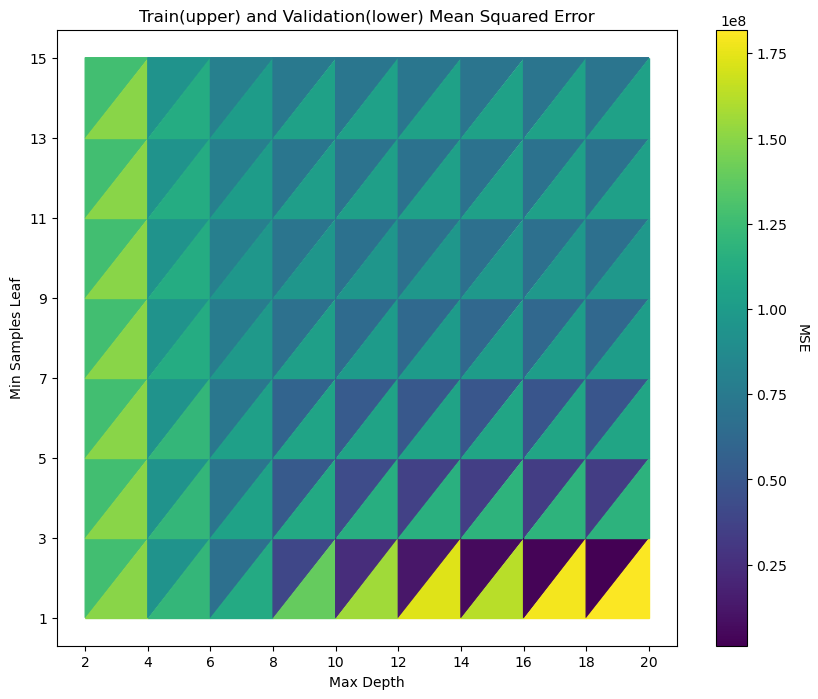

In [156]:
x = sorted(results['max_depth'].unique())
y = sorted(results['min_samples_leaf'].unique())

z_train = results.pivot(index='min_samples_leaf', columns='max_depth', values='train_mse')
z_valid = results.pivot(index='min_samples_leaf', columns='max_depth', values='valid_mse')

fig, ax = plt.subplots(figsize=(10, 8))
cmap = plt.get_cmap('viridis')

norm = mcolors.Normalize(vmin=min(z_train.min().min(), z_valid.min().min()), vmax=max(z_train.max().max(), z_valid.max().max()))

for i, x_val in enumerate(x[:-1]):
    for j, y_val in enumerate(y[:-1]):
        x0, x1 = x_val, x[i + 1]
        y0, y1 = y_val, y[j + 1]
        
        train_mse = z_train.iloc[j, i]
        valid_mse = z_valid.iloc[j, i]
        norm = mcolors.Normalize(vmin=min(z_train.min().min(), z_valid.min().min()),
                                 vmax=max(z_train.max().max(), z_valid.max().max()))
        train_color = cmap(norm(train_mse))
        valid_color = cmap(norm(valid_mse))
        
        ax.fill(
            [x0, x1, x0],
            [y0, y1, y1],
            color=train_color
        )
        
        ax.fill(
            [x0, x1, x1],
            [y0, y0, y1],
            color=valid_color
        )

sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label("MSE", rotation=270, labelpad=15)

ax.set_title("Train(upper) and Validation(lower) Mean Squared Error")
ax.set_xlabel("Max Depth")
ax.set_ylabel("Min Samples Leaf")
ax.set_xticks(x)
ax.set_yticks(y)

plt.show()

#### Alternativní vizualizace pro lepší rozlišení dat

Vzhledem k tomu, že v předchozí heatmapě jsou data špatně rozlišitelná kvůli podobným barvám, použijeme jiný typ vizualizace, jak to bylo ukázáno v příkladech z cvičení.

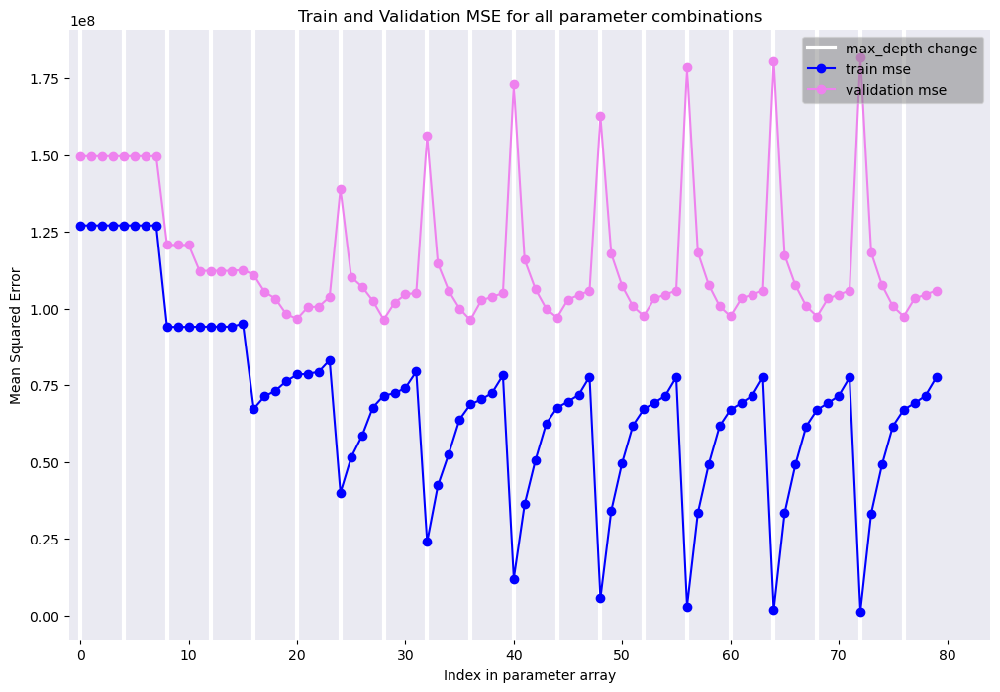

In [157]:
fig, ax = plt.subplots(figsize=(12,8))

for x in range(0, 80, 4):
    plt.axvline(x=x, c='white', linewidth=3, label='max_depth change')

ax.plot(results['train_mse'], 'o-', color='blue', label='train mse')
ax.plot(results['valid_mse'],'o-', color='violet', label='validation mse')

handles, labels = ax.get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(), facecolor='grey', framealpha=0.5)

ax.set_xlim(left=-1, right=84)
ax.set(facecolor='#eaeaf2')
for key, spine in ax.spines.items():
    spine.set_visible(False)

ax.set_xlabel('Index in parameter array')
ax.set_ylabel('Mean Squared Error')
ax.set_title('Train and Validation MSE for all parameter combinations')

plt.show()

Z grafu je patrné, že některé hodnoty hyperparametrů vedou k lepším výsledkům (nižší MSE), což potvrzuje správnost jejich výběru. Tato vizualizace nám pomáhá lépe pochopit, jak jednotlivé kombinace hodnot hyperparametrů ovlivňují výkon modelu. Je evidentní, že zvolená kombinace hodnot **max_depth** a **min_samples_leaf** byla pro tento model optimální.

## Vytvoření vizualizace rozhodovacího stromu

Pro lepší pochopení toho, jak model rozhoduje o predikci cen, vytvoříme vizualizaci rozhodovacího stromu, který byl natrénován s optimálními hodnotami **max_depth** a **min_samples_leaf**. Tento graf nám ukáže strukturu rozhodování modelu, jeho rozhodovací pravidla a rozdíly mezi různými hodnotami vstupních proměnných.

Pro zobrazení stromu použijeme knihovnu **dtreeviz**, která poskytuje podrobný pohled na to, jak strom modeluje data a jak se různé vstupy promítají do predikcí. Tento nástroj nám umožní jasně vidět, jaké podmínky jsou použity v každé větvi stromu pro rozhodování o ceně.

In [158]:
best_regressor = DecisionTreeRegressor(max_depth=int(best_result['max_depth']), min_samples_leaf=int(best_result['min_samples_leaf']), random_state=42)
best_regressor.fit(X_train, y_train)

regressor_viz = dtreeviz.model(
    best_regressor,
    X_train,
    y_train,
    feature_names=X.columns,
    target_name='Rent per month'
)
regressor_viz.view()

c:\Users\hrkcz001\scoop\apps\anaconda3\2024.10-1\App\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names


#### Ocenění důležitosti příznaků

Nyní se zaměříme na **důležitost jednotlivých příznaků** v našem modelu. Pomocí vestavěné metody modelu můžeme získat skóre pro každý příznak, které ukazuje, jak silně ovlivňuje predikci ceny pronájmu.

Tato hodnocení nám umožní zjistit, které příznaky mají největší vliv na výsledek modelu, což je užitečné pro pochopení jeho fungování a pro případné zlepšení modelu v budoucnu. 

In [159]:
importance_df = pd.DataFrame({
    'feature': X_train.columns,
    'importance': best_regressor.feature_importances_
})

print(importance_df.sort_values('importance', ascending=False))

           feature  importance
2             Area    0.928320
6         Location    0.038393
1            Floor    0.017689
4        Condition    0.009152
3     Construction    0.005301
5        Ownership    0.000743
0  Time to move in    0.000401


### Vliv příznaků *Area* a *Floor* na model

Nyní se podíváme na to, jak příznaky *Area* a *Floor* ovlivňují náš model pomocí vizualizace rozhodovací hranice.

Tato vizualizace nám ukáže, jaký vztah existuje mezi těmito dvěma příznaky a predikovanými hodnotami ceny. Bude to skvělý způsob, jak vizuálně interpretovat chování modelu a lépe pochopit, jak se rozhoduje na základě těchto dvou konkrétních příznaků.

c:\Users\hrkcz001\scoop\apps\anaconda3\2024.10-1\App\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names


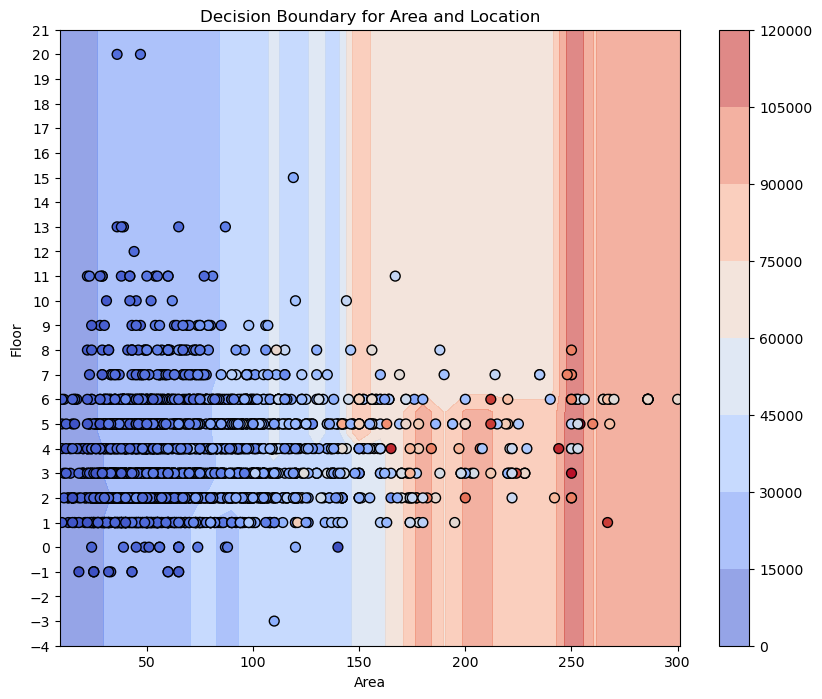

In [160]:
X_train_selected = X_train[['Area', 'Floor']]
best_regressor.fit(X_train_selected, y_train)

x_min, x_max = X_train_selected['Area'].min() - 1, X_train_selected['Area'].max() + 1
y_min, y_max = X_train_selected['Floor'].min() - 1, X_train_selected['Floor'].max() + 1

xx, yy = np.meshgrid(np.linspace(x_min, x_max, 30), 
                     np.linspace(y_min, y_max, 30))

grid_points = np.c_[xx.ravel(), yy.ravel()]
Z = best_regressor.predict(grid_points)
Z = Z.reshape(xx.shape)

fig, ax = plt.subplots(figsize=(10, 8))

contour = ax.contourf(xx, yy, Z, cmap='coolwarm', alpha=0.6)

scatter = ax.scatter(X_train_selected['Area'], X_train_selected['Floor'], 
                     c=y_train, cmap='coolwarm', edgecolor='k', s=50)

ax.set_xlabel('Area')
ax.set_ylabel('Floor')
ax.set_title('Decision Boundary for Area and Location')
ax.set_yticks(np.arange(y_min, y_max + 1, step=1)) 

fig.colorbar(contour)

plt.show()

Jak ukázala analýza **důležitosti příznaků**, největší vliv na predikci ceny má skutečně *Area* (plocha). Tento výsledek koresponduje s našimi očekáváními, protože větší byty mají zpravidla vyšší cenu. 

Zajímavým zjištěním je, že model predikuje nejvyšší ceny na **středních patrech**. Tento trend se zdá být realistický, protože v reálném světě bývají byty na středních podlažích často dražší než в přízemí nebo na vysokých patrech.

### Celkové hodnocení kvality predikcí

Pro zhodnocení kvality predikcí naší modelu použijeme vizualizaci, která nám ukáže, jak dobře model předpovídá ceny na základě skutečných hodnot. Použijeme **scatter plot**. Tato vizualizace nám pomůže zjistit, zda se predikce drží blízko skutečných hodnot, a zda existují nějaké výrazné odchylky, které by signalizovaly potřebu zlepšení modelu.

Text(0, 0.5, 'Predicted')

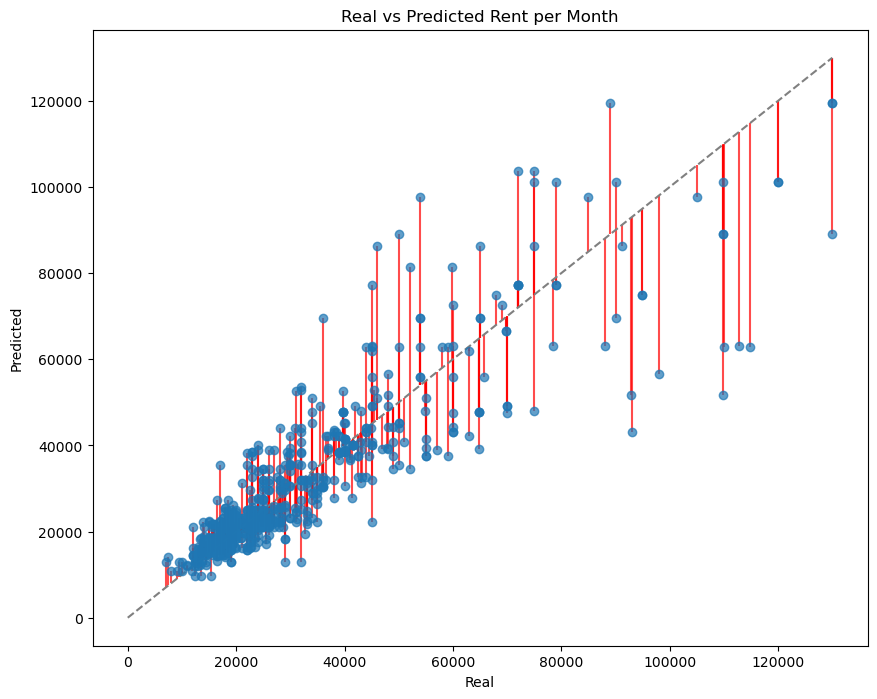

In [161]:
best_regressor = best_regressor.fit(X_train, y_train)

y_pred = best_regressor.predict(X_test)

max_rent = y_test.max()

fix, ax = plt.subplots(figsize=(10, 8))
ax.vlines(y_test, ymin=y_test, ymax=y_pred, color='red', alpha=0.7, zorder=1)
ax.plot([0, max_rent], [0, max_rent], color='grey', linestyle='--')
ax.scatter(y_test, y_pred, alpha=0.7, zorder=2)

ax.set_title('Real vs Predicted Rent per Month')
ax.set_xlabel('Real')
ax.set_ylabel('Predicted')

Pro ceny, které nebyly v datech dostatečně reprezentovány, stále pozorujeme velká odchylky v predikcích. Avšak pro ceny blízké mediáně jsou predikce mnohem přesnější a model vykazuje lepší výkon. Tento trend ukazuje, že model má tendenci být silnější při predikci běžnějších cenových kategorií, zatímco v případě vzácných nebo extrémních hodnot je jeho výkon omezený.

Vytvoříme vizualizaci ve formě tabulky, kde jednotlivé řádky budou zvýrazněny barvami podle velikosti chyby v predikcích. Tento způsob vizualizace nám umožní snadněji identifikovat konkrétní případy s většími odchylkami mezi skutečnými a predikovanými hodnotami, což nám poskytne cenné informace pro další analýzu a možné zlepšení modelu.

In [162]:
df = pd.DataFrame({
    'Real': y_test,
    'Predicted': y_pred,
    'Error': abs(y_test - y_pred)
})

def highlight_error(row):
    error_quantiles = df['Error'].quantile([0.25, 0.5, 0.75])
    
    if row['Error'] <= error_quantiles[0.25]:
        return ['background-color: #66CDAA'] * len(row)
    elif row['Error'] <= error_quantiles[0.5]:
        return ['background-color: #FFD700'] * len(row)
    elif row['Error'] <= error_quantiles[0.75]:
        return ['background-color: #FFA07A'] * len(row)
    else:
        return ['background-color: #FF6347'] * len(row)

styled_df = df.style.apply(highlight_error, axis=1)

styled_df = styled_df.hide(axis="index")
styled_df = styled_df.set_table_styles(
    [{'selector': 'td', 'props': [('color', 'black')]}
])

styled_df = styled_df.set_table_attributes('style="max-height: 700px; overflow-y: auto; display: block;"')

styled_df

Real,Predicted,Error
20500.000000,23220.238806,2720.238806
30000.000000,38331.818182,8331.818182
19500.000000,17067.424242,2432.575758
54900.000000,47889.000000,7011.000000
65000.000000,86183.333333,21183.333333
13500.000000,15673.333333,2173.333333
24000.000000,25036.687500,1036.687500
22990.000000,38421.739130,15431.739130
23000.000000,22221.258993,778.741007
33000.000000,21824.017857,11175.982143
